In [196]:
# import the library .

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import statsmodels.api as sm


%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.style.use('fivethirtyeight')
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 30)
pd.set_option('display.max_rows', 2000)
from datetime import datetime

In [239]:
import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
# multi variable timeserise .
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.vector_ar.var_model import VAR
# uni variable timeserise.
from statsmodels.tsa.arima_model import ARMA, ARIMA, AR
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score


In [240]:
from datetime import datetime
from fbprophet import Prophet
from sklearn.metrics import r2_score
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import adfuller

In [241]:
#Load dataset
df = pd.read_csv('final_con.csv',index_col='Date')
df.index.freq = 'MS'

In [199]:
# convert to Datetime index
df = df.set_index(pd.to_datetime(df.index))

In [200]:
df.index

DatetimeIndex(['1993-07-01', '1993-08-01', '1993-09-01', '1993-10-01',
               '1993-11-01', '1993-12-01', '1994-01-01', '1994-02-01',
               '1994-03-01', '1994-04-01',
               ...
               '2018-11-01', '2018-12-01', '2019-01-01', '2019-02-01',
               '2019-03-01', '2019-04-01', '2019-05-01', '2019-06-01',
               '2019-07-01', '2019-08-01'],
              dtype='datetime64[ns]', name='Date', length=314, freq=None)

# checking for gasoline price:

In [201]:
# take the column that we want to check if the data is  stationary  or not . 
df1=df[['Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)']]

In [202]:
# split the date that we want to forecast it . 
df1=df1[df1.index > '2015-01-01']
df1.head()

,Weekly U.S. All Grades All Formulations Retail Gasoline Prices (Dollars per Gallon)
Date,
2015-02-01,2.401250
2015-03-01,2.544000
2015-04-01,2.573333
2015-05-01,2.814400
2015-06-01,2.890250


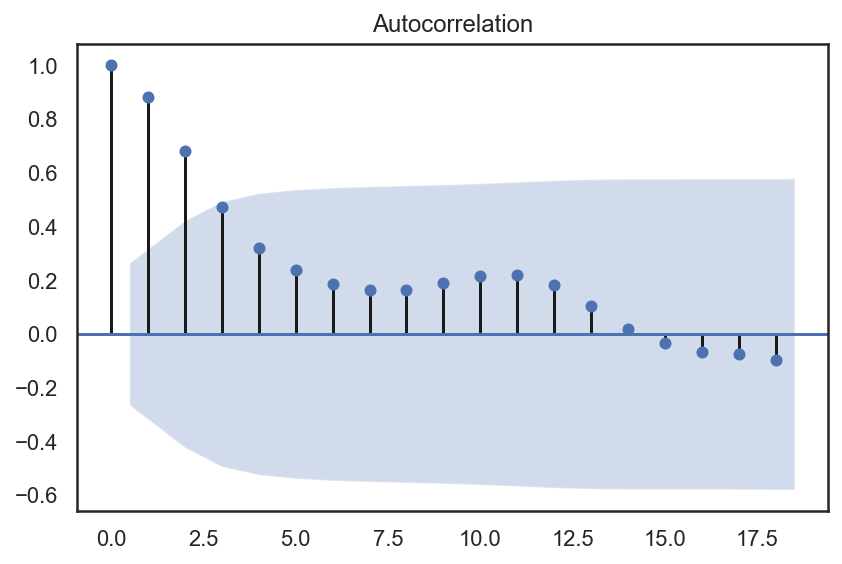

In [205]:
# plot the autocorrelation .
sns.set(style="white")
plot_acf(df1);

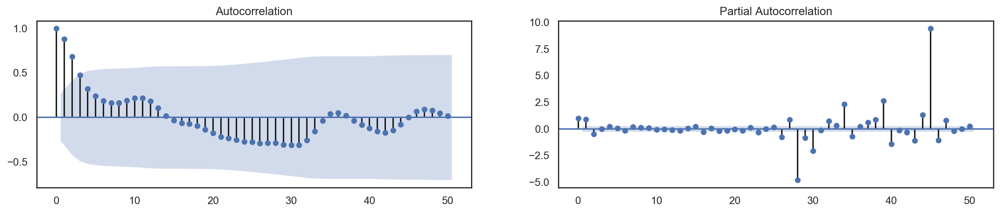

In [206]:
# Draw Plot
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(df1.values.tolist(), lags=50, ax=axes[0]);
plot_pacf(df1.values.tolist(), lags=50, ax=axes[1]);

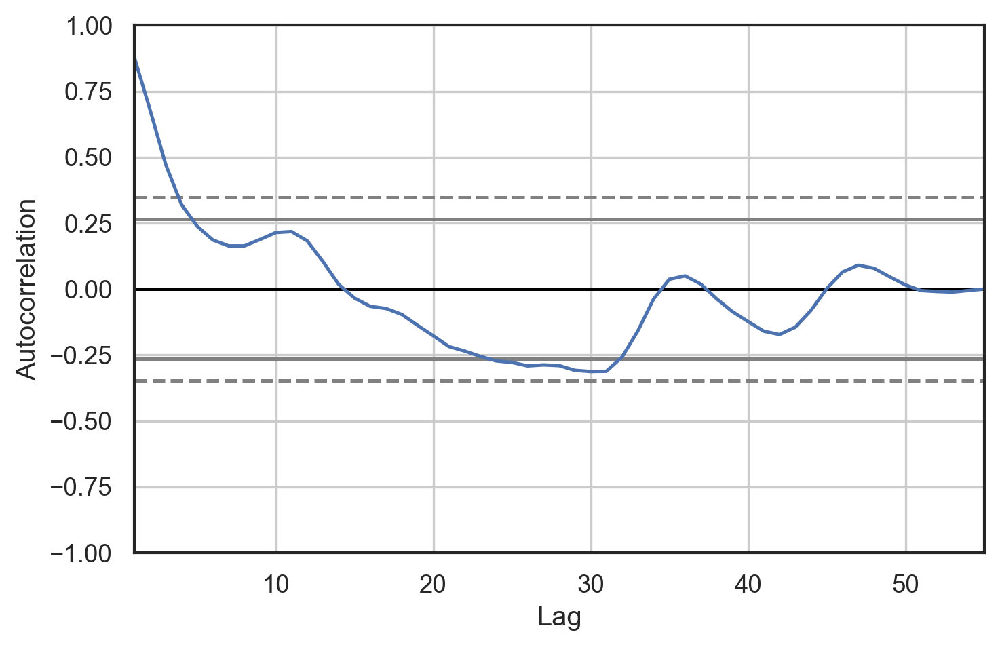

In [208]:
# Draw Plot of auto correlotion 
plt.rcParams.update({'figure.figsize':(6,4), 'figure.dpi':120})
autocorrelation_plot(df1.values.tolist())

In [209]:
title ='average of Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)'

In [210]:
def adf_test(series):

    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string()) # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

#### Test for stationarity: If the test statistic is less than the critical value, we can reject the null hypothesis (aka the series is stationary). When the test statistic is greater than the critical value, we fail to reject the null hypothesis (which means the series is not stationary).


### The test statistic > critical value, which implies that the series is not stationary. This confirms our original observation which we initially saw in the visual test.

In [211]:
adf_test(df1['Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)'])

Augmented Dickey-Fuller Test: average of Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)
ADF test statistic      -2.727362
p-value                  0.069422
# lags used              1.000000
# observations          53.000000
critical value (1%)     -3.560242
critical value (5%)     -2.917850
critical value (10%)    -2.596796
Fail to reject the null hypothesis
Data is non-stationary


In [212]:
#define function for kpss test
from statsmodels.tsa.stattools import kpss
#define KPSS
def kpss_test(timeseries):
    print ('Results of KPSS Test:')
    kpsstest= kpss(timeseries, regression='c')
    kpss_output= pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)

#### 2 . KPSS (Kwiatkowski-Phillips-Schmidt-Shin) Test
KPSS is another test for checking the stationarity of a time series (slightly less popular than the Dickey Fuller test). The null and alternate hypothesis for the KPSS test are opposite that of the ADF test, which often creates confusion.


The authors of the KPSS test have defined the null hypothesis as the process is trend stationary, to an alternate hypothesis of a unit root series. We will understand the trend stationarity in detail in the next section. For now, let’s focus on the implementation and see the results of the KPSS test.


## Null Hypothesis: The process is trend stationary.
## Alternate Hypothesis: The series has a unit root (series is not stationary).

In [213]:
kpss_test(df1['Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)'])

Results of KPSS Test:
Test Statistic            0.323962
p-value                   0.100000
Lags Used                11.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


# checking for gasoline Consumption :

In [260]:
# take the column that we want to check if the data is  stationary  or not . 
df2=df[['Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)']]

In [261]:
# split the date that we want to forecast it . 
df2=df2[df2.index > '2015-01-01']
df2.head()

,Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)
Date,
2015-02-01,8498.257
2015-03-01,8717.704
2015-04-01,8845.658
2015-05-01,8915.920
2015-06-01,9064.745


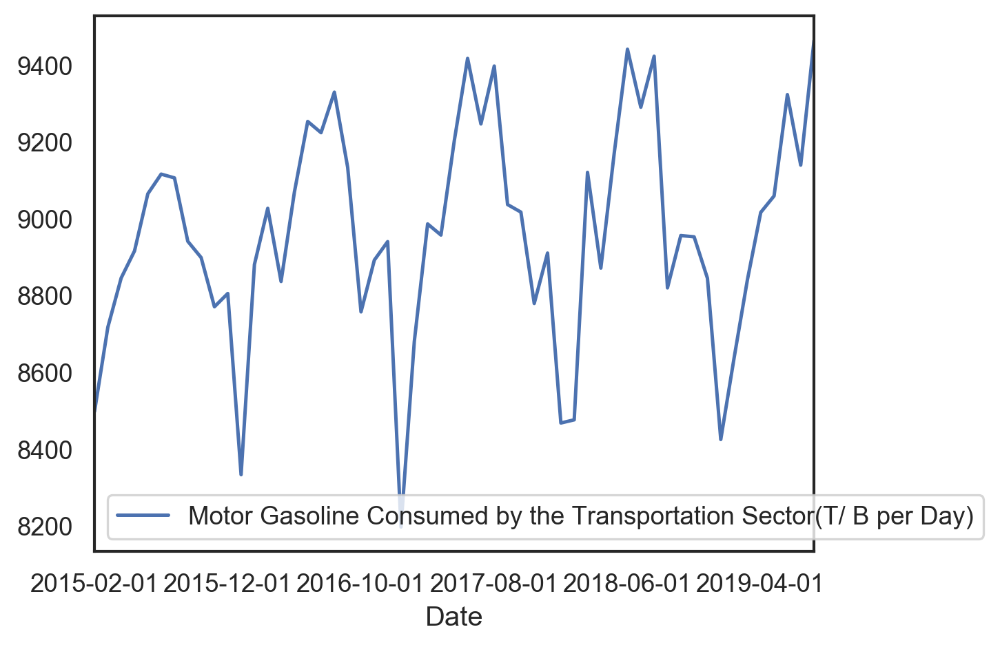

In [262]:
#draw the plot 
sns.set(style="white")
df2.plot()

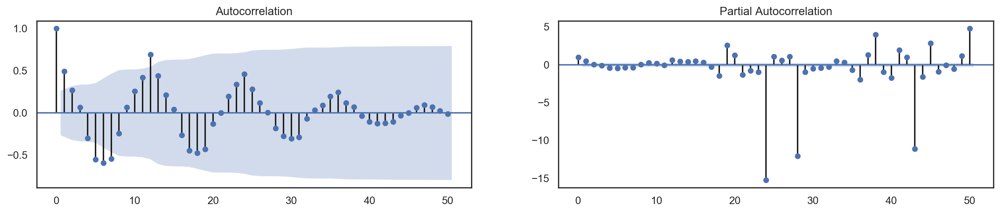

In [220]:
# Draw Plot
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(df2.values.tolist(), lags=50, ax=axes[0]);
plot_pacf(df2.values.tolist(), lags=50, ax=axes[1]);

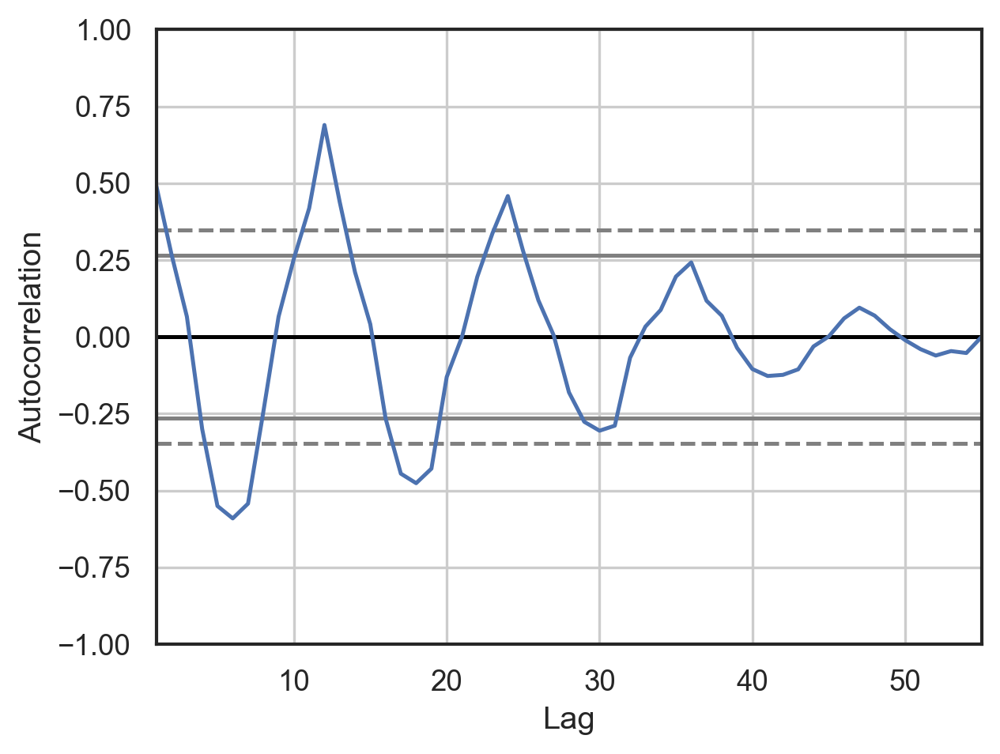

In [222]:
# Draw Plot of auto correlotion 
plt.rcParams.update({'figure.figsize':(5,4), 'figure.dpi':120})
autocorrelation_plot(df2.values.tolist())

In [223]:
title ='Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)'

In [224]:
#adfuller test
adf_test(df2['Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)'])

Augmented Dickey-Fuller Test: Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)
ADF test statistic      -3.937082
p-value                  0.001778
# lags used             11.000000
# observations          43.000000
critical value (1%)     -3.592504
critical value (5%)     -2.931550
critical value (10%)    -2.604066
Reject the null hypothesis
Data is stationary


In [225]:
#kpss test
kpss_test(df2['Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)'])

Results of KPSS Test:
Test Statistic            0.592170
p-value                   0.023348
Lags Used                11.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


# Prophet model for the gasoline Consumption :

In [244]:
# but the column that we want to predict in diff data frame .
d=df[['Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)']]
d.head()

,Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)
Date,
1993-07-01,7671.122
1993-08-01,7749.086
1993-09-01,7496.345
1993-10-01,7274.525
1993-11-01,7422.855


In [245]:
# take the data  from 2015 -2019
d=d[d.index > '2015-01-01']
d.head()

,Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)
Date,
2015-02-01,8498.257
2015-03-01,8717.704
2015-04-01,8845.658
2015-05-01,8915.920
2015-06-01,9064.745


In [246]:
# rest the index ds to the date and y for price 
d1=d.reset_index()
d1.columns=['ds','y']

In [247]:
# look to the head .
d1.head()

,ds,y
0,2015-02-01,8498.257
1,2015-03-01,8717.704
2,2015-04-01,8845.658
3,2015-05-01,8915.920
4,2015-06-01,9064.745


In [248]:
# split the data into train and test , Set four month for testing
train_c = d1.iloc[:-12]
test_c = d1.iloc[len(d1)-12:]

In [249]:
# fit the model 
mod=Prophet()
mod.fit(train_c)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [250]:
#make future prediction 
c=mod.make_future_dataframe(periods=-12,freq='MS')

In [251]:
# predict the data .
forcast_c=mod.predict(test_c.drop(columns="y"))

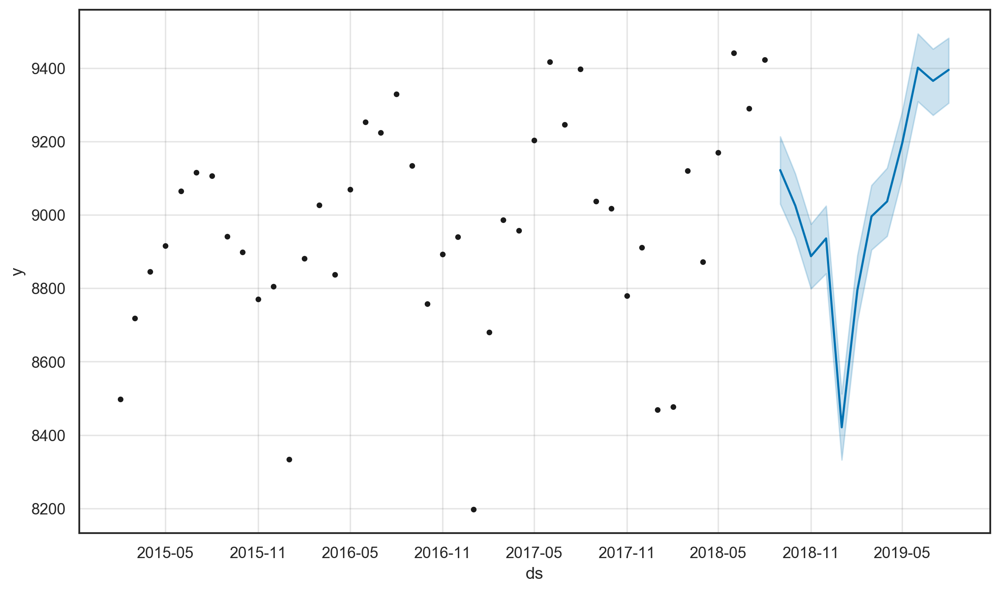

In [252]:
#plot the prediction
mod.plot(forcast_c);

In [253]:
# make a seperate data set for prediction only
pred = forcast_c[['ds','yhat']][forcast_c.ds >='2015']

In [254]:
# set time as index
predi= pred.set_index('ds')
test_c1= test_c.set_index('ds')

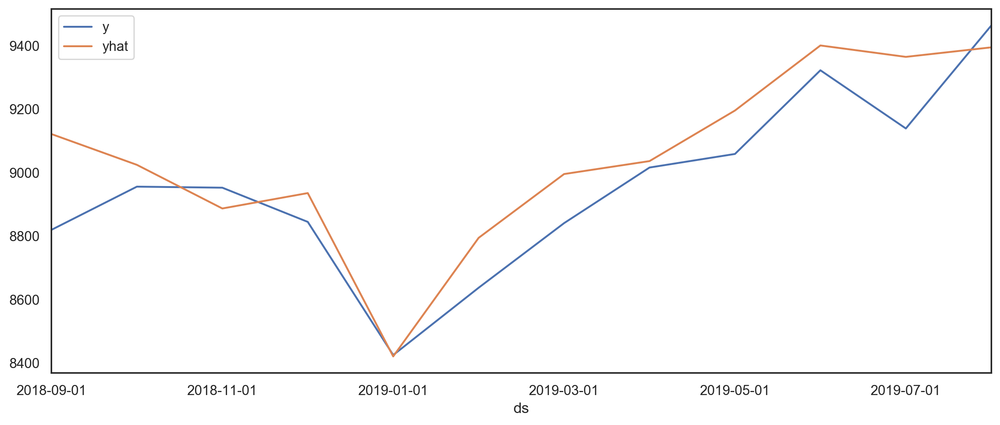

In [255]:
# plot test vs prediction
test_c1.y.plot(legend=True)
pred.yhat.plot(figsize=(12,5) , legend=True)

In [256]:
# calculate r2 score
r2_score(test_c1.y , pred.yhat)

0.7256447409620468

In [258]:
# This returns a plotly Figure
from fbprophet.plot import plot_plotly
import plotly.offline as py
fig = plot_plotly(mod, forcast_c)  
py.iplot(fig)

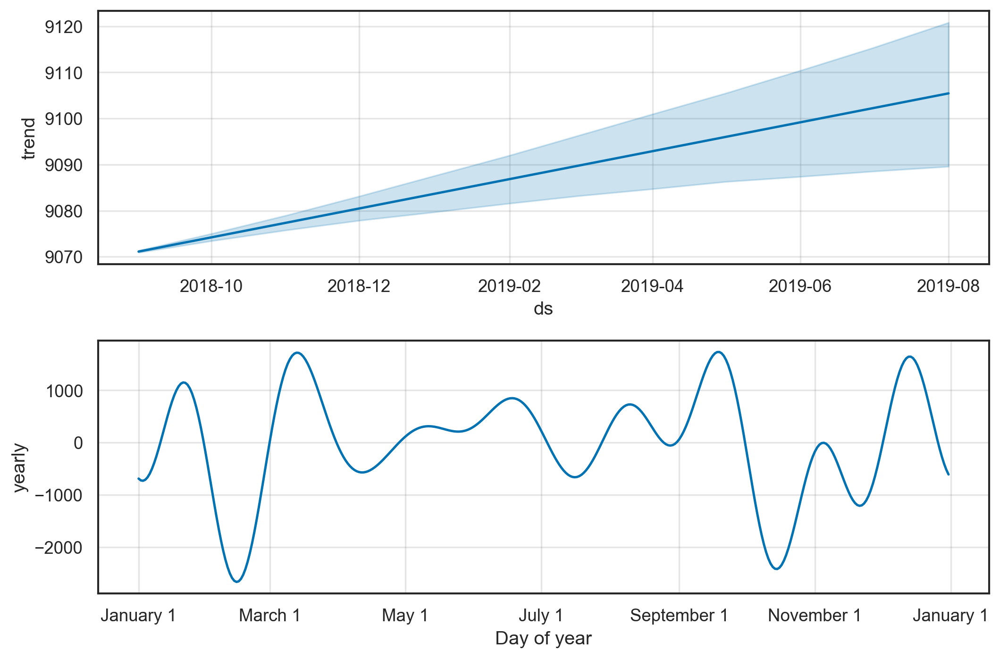

In [259]:
# plot the components .
mod.plot_components(forcast_c);

# Prophet model for the gasoline  price :

In [265]:
# but the column that we want to predict in diff data frame .
df1=df[['Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)']]


In [266]:
# take the data  from 2015 -2019
df1=df1[df1.index > '2015-01-01']
df1.head()

,Weekly U.S. All Grades All Formulations Retail Gasoline Prices (Dollars per Gallon)
Date,
2015-02-01,2.401250
2015-03-01,2.544000
2015-04-01,2.573333
2015-05-01,2.814400
2015-06-01,2.890250


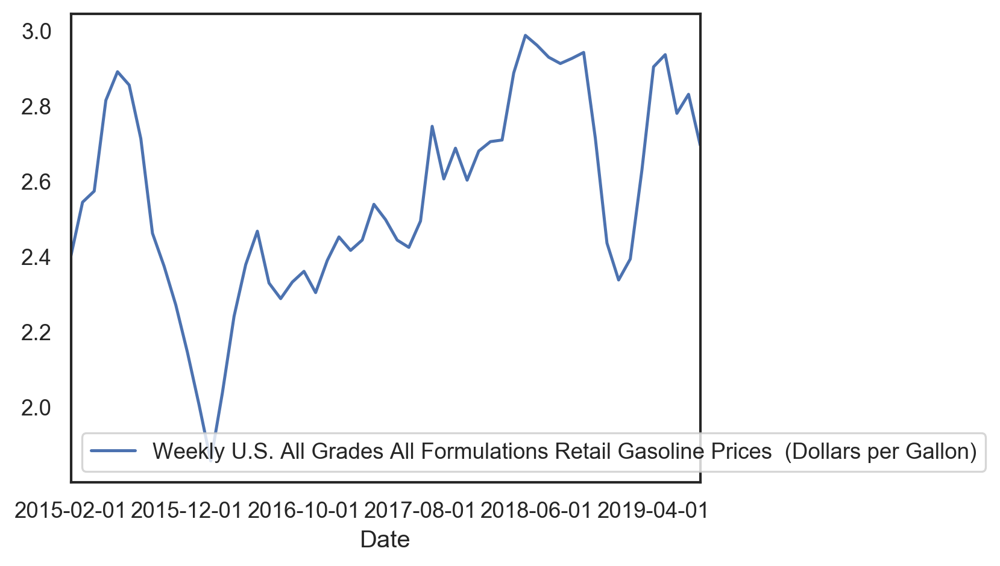

In [267]:
#plot the data .
sns.set(style="white")
df1.plot()

In [268]:
# rest the index ds to the date and y for price 
df2=df1.reset_index()
df2.columns=['ds','y']

In [269]:
# look to the head .
df2.head()

,ds,y
0,2015-02-01,2.401250
1,2015-03-01,2.544000
2,2015-04-01,2.573333
3,2015-05-01,2.814400
4,2015-06-01,2.890250


In [270]:
# split the data into train and test , Set four month for testing
train = df2.iloc[:-12]
test = df2.iloc[len(df2)-12:]

In [271]:
# fit the model 
model=Prophet()
model.fit(train)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [272]:
#make future prediction 
m=model.make_future_dataframe(periods=-12,freq='MS')

In [273]:
# predict the data .
forcast=model.predict(test.drop(columns="y"))

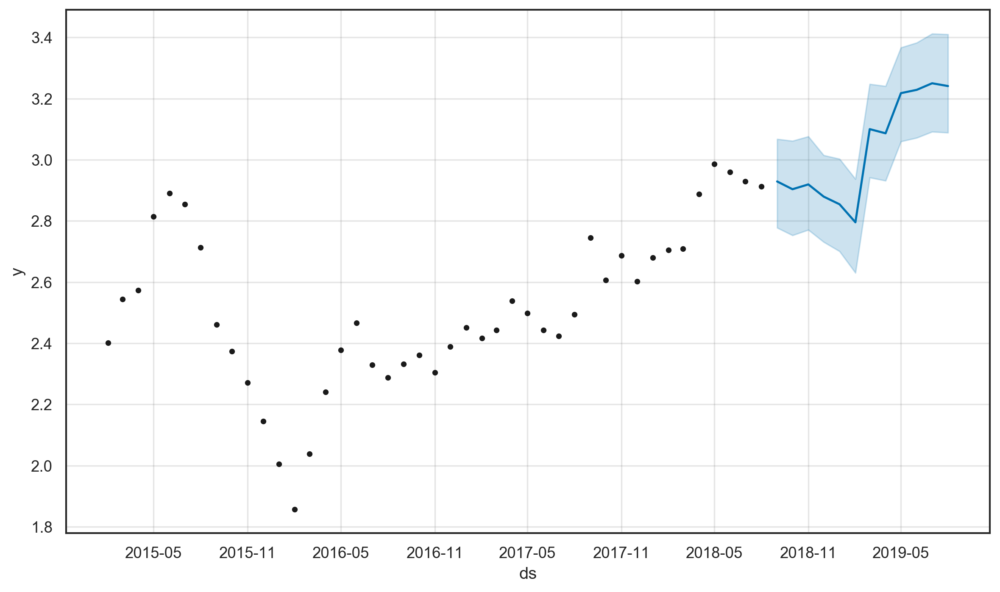

In [274]:
#plot the prediction
model.plot(forcast);

In [275]:
# make a seperate data set for prediction only
prediction = forcast[['ds','yhat']][forcast.ds >='2015']

In [276]:
# set time as index
predictions = prediction.set_index('ds')
tests= test.set_index('ds')

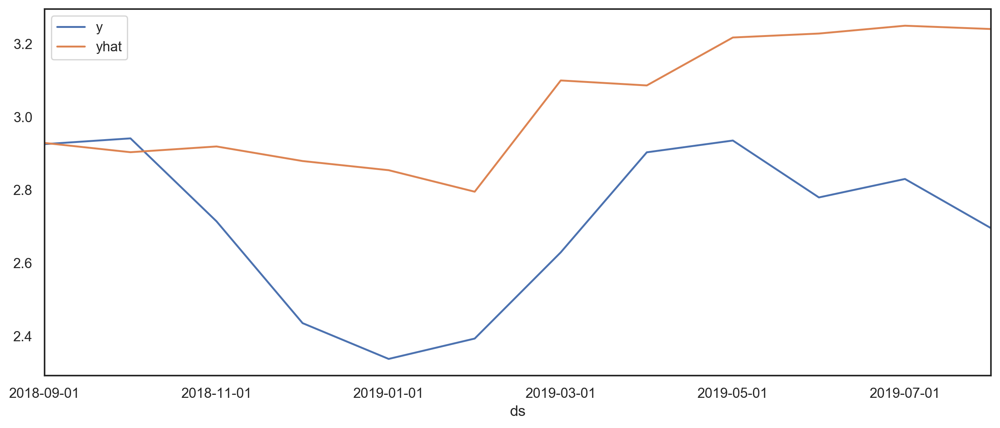

In [277]:
# plot test vs prediction
tests.y.plot(legend=True)
prediction.yhat.plot(figsize=(12,5) , legend=True)

In [278]:
# calculate r2 score
r2_score(tests.y , predictions.yhat)

-2.174993540199929

In [279]:
py.init_notebook_mode()

fig = plot_plotly(model, forcast)  # This returns a plotly Figure
py.iplot(fig)

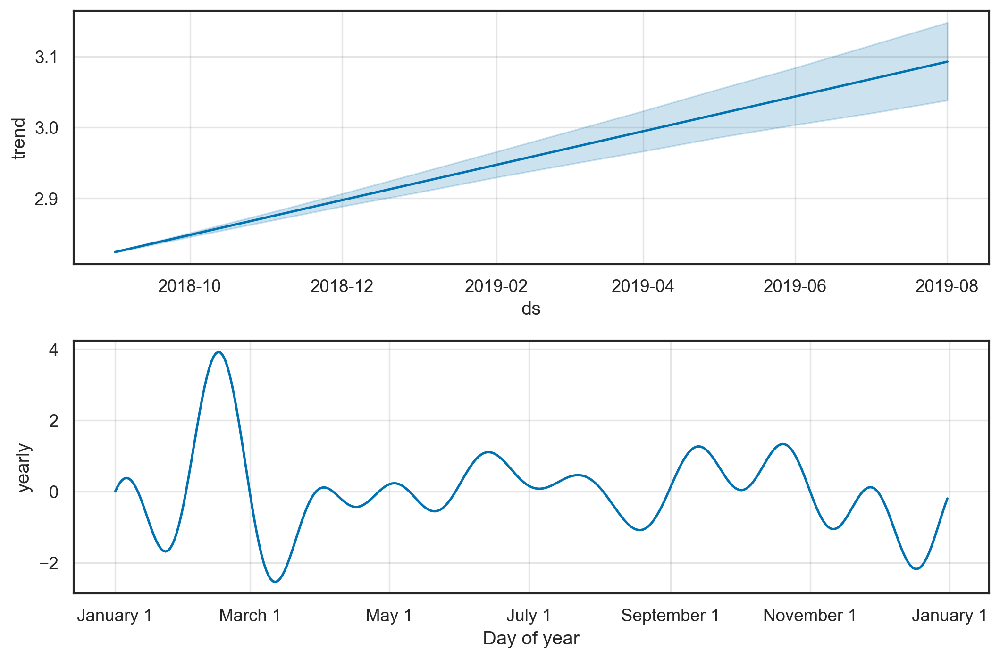

In [280]:
# plot the components .
model.plot_components(forcast);

# ARIMA model for the gasoline Consumed :

In [150]:
df1=df[['Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)']]

In [151]:
df1=df1[df1.index > '2015-01-01']
df1.head()

,Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)
Date,
2015-02-01,8498.257
2015-03-01,8717.704
2015-04-01,8845.658
2015-05-01,8915.920
2015-06-01,9064.745


In [152]:
# split the data into train and test , Set four month for testing
train = df1.iloc[:-12]
test = df1.iloc[len(df1)-12:]

In [153]:
#p,d,q  p = periods taken for autoregressive model
#d -> Integrated order, difference
# q periods in moving average model-----(7, 2, 1)
model_arima = ARIMA(train,order=(7, 2, 2))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())
print(model_arima_fit.aic)

                                                       ARIMA Model Results                                                       
Dep. Variable:     D2.Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)   No. Observations:                   41
Model:                                                                    ARIMA(7, 2, 2)   Log Likelihood                -269.520
Method:                                                                          css-mle   S.D. of innovations            132.551
Date:                                                                   Tue, 17 Dec 2019   AIC                            561.039
Time:                                                                           10:35:10   BIC                            579.889
Sample:                                                                       04-01-2015   HQIC                           567.903
                                                                            - 08-01-2018  

In [154]:
# make prediction .
predictions= model_arima_fit.forecast(steps=12)[0]
predictions

array([9199.34093029, 8828.08643   , 8871.44876601, 8649.00655949,
       8478.4799722 , 8688.12369213, 8776.21080465, 8931.46245116,
       9189.60115424, 9240.8313295 , 9302.1043449 , 9280.23891945])

In [21]:
# but the rang from 0-9
import itertools
p=d=q=range(0,9)
pdq = list(itertools.product(p,d,q))
pdq

[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 0, 3),
 (0, 0, 4),
 (0, 0, 5),
 (0, 0, 6),
 (0, 0, 7),
 (0, 0, 8),
 (0, 1, 0),
 (0, 1, 1),
 (0, 1, 2),
 (0, 1, 3),
 (0, 1, 4),
 (0, 1, 5),
 (0, 1, 6),
 (0, 1, 7),
 (0, 1, 8),
 (0, 2, 0),
 (0, 2, 1),
 (0, 2, 2),
 (0, 2, 3),
 (0, 2, 4),
 (0, 2, 5),
 (0, 2, 6),
 (0, 2, 7),
 (0, 2, 8),
 (0, 3, 0),
 (0, 3, 1),
 (0, 3, 2),
 (0, 3, 3),
 (0, 3, 4),
 (0, 3, 5),
 (0, 3, 6),
 (0, 3, 7),
 (0, 3, 8),
 (0, 4, 0),
 (0, 4, 1),
 (0, 4, 2),
 (0, 4, 3),
 (0, 4, 4),
 (0, 4, 5),
 (0, 4, 6),
 (0, 4, 7),
 (0, 4, 8),
 (0, 5, 0),
 (0, 5, 1),
 (0, 5, 2),
 (0, 5, 3),
 (0, 5, 4),
 (0, 5, 5),
 (0, 5, 6),
 (0, 5, 7),
 (0, 5, 8),
 (0, 6, 0),
 (0, 6, 1),
 (0, 6, 2),
 (0, 6, 3),
 (0, 6, 4),
 (0, 6, 5),
 (0, 6, 6),
 (0, 6, 7),
 (0, 6, 8),
 (0, 7, 0),
 (0, 7, 1),
 (0, 7, 2),
 (0, 7, 3),
 (0, 7, 4),
 (0, 7, 5),
 (0, 7, 6),
 (0, 7, 7),
 (0, 7, 8),
 (0, 8, 0),
 (0, 8, 1),
 (0, 8, 2),
 (0, 8, 3),
 (0, 8, 4),
 (0, 8, 5),
 (0, 8, 6),
 (0, 8, 7),
 (0, 8, 8),
 (1, 0, 0),
 (1, 0, 1),
 (1,

In [22]:
# make for loop to present  the best pdq..and the best is (7, 2, 2) which is our guess number .
for param in pdq:
    try:
        model_arima = ARIMA(train,order=param)
        model_arima_fit = model_arima.fit()
        print(param,model_arima_fit.aic)
    except:
        continue

(0, 0, 0) 612.9428772634996
(0, 0, 1) 603.2595355784282
(0, 0, 2) 604.8330741436619
(0, 0, 3) 598.3682473293568
(0, 0, 5) 594.4411933371354
(0, 0, 6) 596.0730000668666
(0, 0, 7) 593.4844303300391
(0, 0, 8) 595.1131838971357
(0, 1, 0) 594.2083355719893
(0, 1, 1) 593.0593740980286
(0, 1, 2) 594.2442280736243
(0, 1, 3) 587.9934848645099
(0, 1, 4) 589.2973005332944
(0, 1, 5) 582.0975677984436
(0, 2, 0) 618.5476551189411
(0, 2, 1) 586.8813832235996
(1, 0, 0) 601.0076084164658
(1, 0, 1) 602.9753177001037
(1, 0, 2) 605.9849870612846
(1, 0, 3) 593.4606538341765
(1, 0, 4) 601.25146940413
(1, 1, 0) 593.440878727446
(1, 1, 1) 590.3320501890296
(1, 1, 2) 592.2374068500799
(1, 1, 4) 582.9458086603189
(1, 1, 5) 583.8300006298773
(1, 1, 6) 583.4160593066277
(1, 1, 7) 589.0384372230695
(1, 2, 0) 605.3450072250643
(1, 2, 3) 589.6769217150043
(2, 0, 0) 602.9702895153792
(2, 0, 2) 579.700985877929
(2, 1, 0) 594.13607825777
(2, 1, 1) 592.2270726680862
(2, 2, 0) 586.5450955309154
(2, 2, 1) 587.590995186969

                                                       ARIMA Model Results                                                       
Dep. Variable:     D2.Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)   No. Observations:                   41
Model:                                                                    ARIMA(7, 2, 2)   Log Likelihood                -269.520
Method:                                                                          css-mle   S.D. of innovations            132.551
Date:                                                                   Tue, 17 Dec 2019   AIC                            561.039
Time:                                                                           11:00:48   BIC                            579.889
Sample:                                                                       04-01-2015   HQIC                           567.903
                                                                            - 08-01-2018  

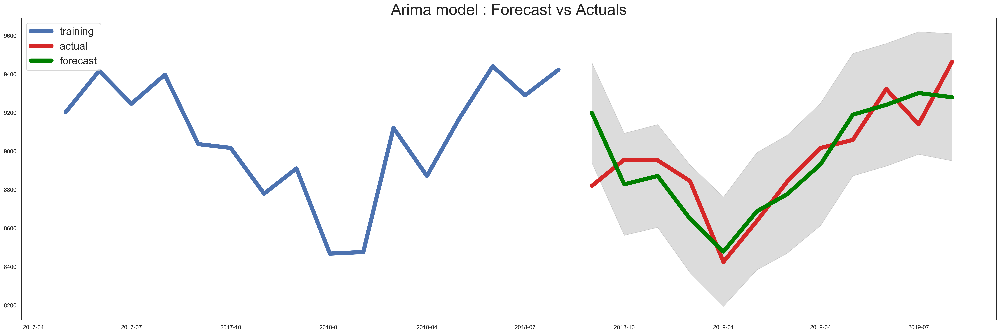

In [190]:
# Build Model
model = ARIMA(train, order=(7, 2, 2))  
fitted = model.fit(disp=-2)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(12, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(30,10), dpi=200)
plt.plot(train[27:], label='training',linewidth=8)
plt.plot(test[:27], label='actual',linewidth=8,color='#D62728',)
plt.plot(fc_series, label='forecast',linewidth=8,color='green')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Arima model : Forecast vs Actuals',fontsize=30)
plt.legend(loc='upper left', fontsize=20)
plt.show()

In [20]:
# check the r2_score for univariate model .
r2_score(test,predictions)

0.6471934066672556

In [157]:
# define exogenous variables 
exog = df.drop(columns=['Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)'])

In [158]:
exog=exog[exog.index > '2015-01-01']
exog.head()

,Weekly U.S. Ending Stocks of Finished Motor Gasoline (Thousand Barrels),U.S. Gasoline Demand (Thousand Barrels per Day),Weekly U.S. Imports of Finished Motor Gasoline (Thousand Barrels per Day),Weekly U.S. All Grades All Formulations Retail Gasoline Prices (Dollars per Gallon),Weekly U.S. Product Supplied of Finished Motor Gasoline (Thousand Barrels per Day),Weekly U.S. Refiner and Blender Net Production of Finished Motor Gasoline (Thousand Barrels per Day),Weekly U.S. Exports of Finished Motor Gasoline (Thousand Barrels per Day),Motor Gasoline Consumed by the Commercial Sector(T/ B per Day),Motor Gasoline Consumed by the Industrial Sector(T/ B per Day)
Date,,,,,,,,,
2015-02-01,29658,8659,24,2.401250,8659.000000,9435,588,195.922,134.381
2015-03-01,29155,8957,14,2.544000,8957.250000,9576,612,200.981,137.851
2015-04-01,26561,9006,60,2.573333,9006.333333,9835,546,203.931,139.874
2015-05-01,25476,9191,48,2.814400,9191.800000,9800,498,205.551,140.985
2015-06-01,25969,9540,25,2.890250,9540.500000,9842,396,208.982,143.339


In [159]:
# split train and test for exogenous variables
exog_to_train = exog.iloc[:-12]
exog_to_test = exog.iloc[len(exog)-12:]

In [160]:
#p,d,q  p = periods taken for autoregressive model
#d -> Integrated order, difference
# q periods in moving average model-----(7, 2, 1)
model_arima = ARIMA(train,order=(0, 0, 5),exog=exog_to_train)
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())
print(model_arima_fit.aic)

                                                      ARMA Model Results                                                      
Dep. Variable:     Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)   No. Observations:                   43
Model:                                                                     ARMA(0, 5)   Log Likelihood                -148.360
Method:                                                                       css-mle   S.D. of innovations              7.150
Date:                                                                Tue, 17 Dec 2019   AIC                            328.721
Time:                                                                        10:36:25   BIC                            356.900
Sample:                                                                    02-01-2015   HQIC                           339.112
                                                                         - 08-01-2018                          

In [161]:
# make prediction .
predictions= model_arima_fit.forecast(steps=12,exog=exog_to_test)[0]
predictions

array([8813.14119097, 8949.70647337, 8951.43547263, 8851.91822967,
       8428.28467576, 8643.92090937, 8842.75451254, 9013.70850153,
       9054.9376392 , 9329.05185256, 9137.72010729, 9469.91094135])

In [81]:
for param in pdq:
    try:
        model_arima = ARIMA(train,order=param,exog=exog_to_train)
        model_arima_fit = model_arima.fit()
        print(param,model_arima_fit.aic)
    except:
        continue

(0, 0, 0) 345.1546173588393
(0, 0, 1) 338.59002155494807
(0, 0, 2) 330.4419413635964
(0, 0, 3) 330.55672212357854
(0, 0, 4) 329.6648978190014
(0, 0, 5) 328.7205523402054
(0, 0, 6) 330.0361718076483
(0, 0, 7) 332.1862245847114
(0, 1, 0) 593.1587655049951
(0, 1, 1) 594.7338245063598
(0, 1, 2) 589.2467452102992
(0, 1, 3) nan
(0, 1, 5) nan
(0, 1, 6) 590.5239313673005
(0, 2, 0) 628.5856366812982
(0, 2, 1) nan
(0, 2, 3) nan
(0, 2, 4) 601.7853362818515
(0, 2, 5) 606.5909307791222
(1, 0, 0) 318.9397929645083
(1, 0, 1) 321.1564551789615
(1, 0, 2) 323.6477597861275
(1, 1, 0) 594.9027099427927
(1, 2, 0) 621.7459045981539
(1, 2, 1) 607.9368152704501
(1, 2, 4) 613.5361541520224
(2, 0, 0) 321.1412542895744
(2, 0, 1) 329.11676550267003
(2, 0, 2) 327.1024868541595
(2, 1, 0) 596.3178498454164
(2, 1, 1) 596.320226728442
(2, 2, 0) 610.0244365856912
(2, 2, 1) 605.3988490562759
(2, 2, 2) 606.3652126392567
(2, 2, 5) 615.4640900791547
(3, 0, 0) 323.99025190015885
(3, 0, 1) 329.460260478487
(3, 0, 2) 327.7239

                                                      ARMA Model Results                                                      
Dep. Variable:     Motor Gasoline Consumed by the Transportation Sector(T/ B per Day)   No. Observations:                   43
Model:                                                                     ARMA(0, 5)   Log Likelihood                -148.360
Method:                                                                       css-mle   S.D. of innovations              7.150
Date:                                                                Tue, 17 Dec 2019   AIC                            328.721
Time:                                                                        17:13:05   BIC                            356.900
Sample:                                                                    02-01-2015   HQIC                           339.112
                                                                         - 08-01-2018                          

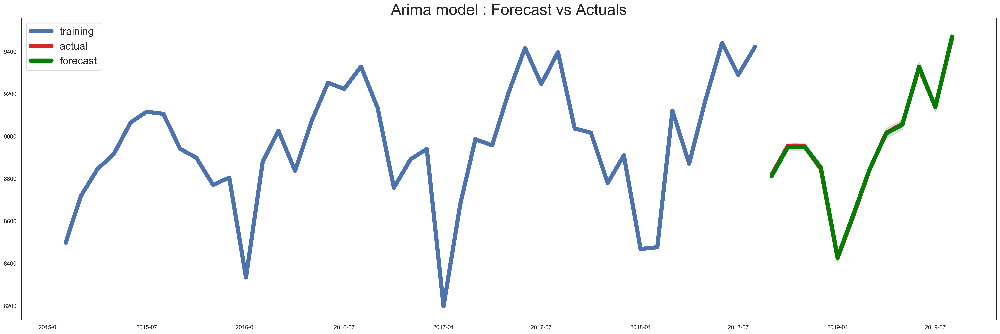

In [195]:
# Build Model (1,0,0) (2,0,2)
model = ARIMA(train, order=(0, 0, 5),exog=exog_to_train)  
fitted = model.fit(disp=1)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(12, alpha=0.05 ,exog=exog_to_test)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(30,10), dpi=200)
plt.plot(train, label='training',linewidth=8)
plt.plot(test, label='actual',linewidth=8,color='#D62728',)
plt.plot(fc_series, label='forecast',linewidth=8,color='green')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Arima model : Forecast vs Actuals',fontsize=30)
plt.legend(loc='upper left', fontsize=20)
plt.show()

In [163]:
# check the r2_score for multivariate .
r2_score(test,predictions)

0.9996640405507247

# ARIMA model for the gasoline price :

In [180]:
# but the column that we want to predict in diff data frame .
d=df[['Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)']]
d.head()

,Weekly U.S. All Grades All Formulations Retail Gasoline Prices (Dollars per Gallon)
Date,
1993-07-01,1.068667
1993-08-01,1.061500
1993-09-01,1.049500
1993-10-01,1.090200
1993-11-01,1.062000


In [181]:
# take the data from 2015 to 2019 .
d=d[d.index > '2015-01-01']
d.head()

,Weekly U.S. All Grades All Formulations Retail Gasoline Prices (Dollars per Gallon)
Date,
2015-02-01,2.401250
2015-03-01,2.544000
2015-04-01,2.573333
2015-05-01,2.814400
2015-06-01,2.890250


In [182]:
# split the data into train and test , Set four month for testing
train_p = d.iloc[:-12]
test_p = d.iloc[len(d)-12:]

In [37]:
#p,d,q  p = periods taken for autoregressive model
#d -> Integrated order, difference
# q periods in moving average model-----(7, 2, 1)
mod_arima = ARIMA(train_p,order=(7, 2, 2))
mod_arima_fit = mod_arima.fit()
print(mod_arima_fit.summary())
print(mod_arima_fit.aic)

                                                                ARIMA Model Results                                                                
Dep. Variable:     D2.Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)   No. Observations:                   41
Model:                                                                                      ARIMA(7, 2, 2)   Log Likelihood                  35.743
Method:                                                                                            css-mle   S.D. of innovations              0.087
Date:                                                                                     Sun, 15 Dec 2019   AIC                            -49.486
Time:                                                                                             22:00:59   BIC                            -30.636
Sample:                                                                                         04-01-2015   HQI

In [38]:
# make for loop to present  the best pdq..
for param in pdq:
    try:
        mod_arima = ARIMA(train_p,order=param)
        mod_arima_fit = mod_arima.fit()
        print(param,mod_arima_fit.aic)
    except:
        continue

(0, 0, 0) 10.989811425969151
(0, 0, 1) -27.003513045614326
(0, 0, 4) -55.52328406639181
(0, 1, 0) -59.255625436812295
(0, 1, 1) -60.462812775787825
(0, 1, 2) -60.278401561491194
(0, 1, 3) -58.959183480829466
(0, 1, 4) -58.57235064075854
(0, 1, 5) -56.654205244457614
(0, 1, 6) -56.022399545511604
(0, 1, 7) -54.57109612823595
(0, 1, 8) -54.905391748919214
(0, 2, 0) -43.694651060510665
(0, 2, 1) -50.158070180521904
(0, 2, 2) -52.815406006245084
(0, 2, 3) -52.98128898240803
(1, 0, 0) -58.531322332400876
(1, 0, 1) -60.67471571004448
(1, 0, 2) -62.21660647551339
(1, 0, 3) -60.21660693795015
(1, 0, 4) -58.42264687376702
(1, 0, 5) -58.170264783689035
(1, 0, 6) -56.408371551380284
(1, 0, 7) -55.36868085269525
(1, 0, 8) -53.88832496569317
(1, 1, 0) -61.13204684055867
(1, 1, 1) -59.14982606908916
(1, 2, 0) -47.453876484230435
(1, 2, 1) -53.64733703085416
(2, 0, 0) -62.60718051046406
(2, 0, 1) -61.307530645002416
(2, 0, 2) -60.216606777758656
(2, 0, 3) -59.249133537727985
(2, 0, 4) -57.59413326496

In [51]:
# retrain our model with order=(0,0,0)
mod_arima = ARIMA(train_p,order=(7, 1, 3))
mod_arima_fit = mod_arima.fit()
print(mod_arima_fit.summary())
print(mod_arima_fit.aic)

                                                               ARIMA Model Results                                                                
Dep. Variable:     D.Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)   No. Observations:                   42
Model:                                                                                     ARIMA(7, 1, 3)   Log Likelihood                  21.993
Method:                                                                                           css-mle   S.D. of innovations              0.116
Date:                                                                                    Sun, 15 Dec 2019   AIC                            -19.986
Time:                                                                                            22:21:11   BIC                              0.866
Sample:                                                                                        03-01-2015   HQIC      

In [52]:
# make prediction .
prediction= mod_arima_fit.forecast(steps=12)[0]
prediction

array([2.69815136, 2.60619214, 2.44904152, 2.42567357, 2.49218558,
       2.61904546, 2.82611088, 2.98398527, 3.11003053, 3.13580285,
       3.08291539, 2.98896901])

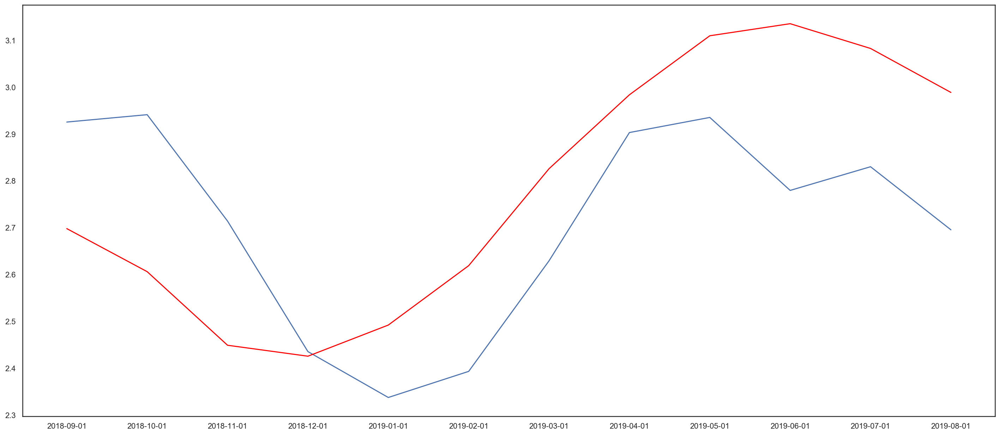

In [53]:
# plot the test vs predictions
sns.set(style="white")
plt.figure(figsize=(22, 10))
plt.plot(test_p)
plt.plot(prediction,color='red')

                                                               ARIMA Model Results                                                                
Dep. Variable:     D.Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)   No. Observations:                   42
Model:                                                                                     ARIMA(7, 1, 3)   Log Likelihood                  21.993
Method:                                                                                           css-mle   S.D. of innovations              0.116
Date:                                                                                    Tue, 17 Dec 2019   AIC                            -19.986
Time:                                                                                            17:07:12   BIC                              0.866
Sample:                                                                                        03-01-2015   HQIC      

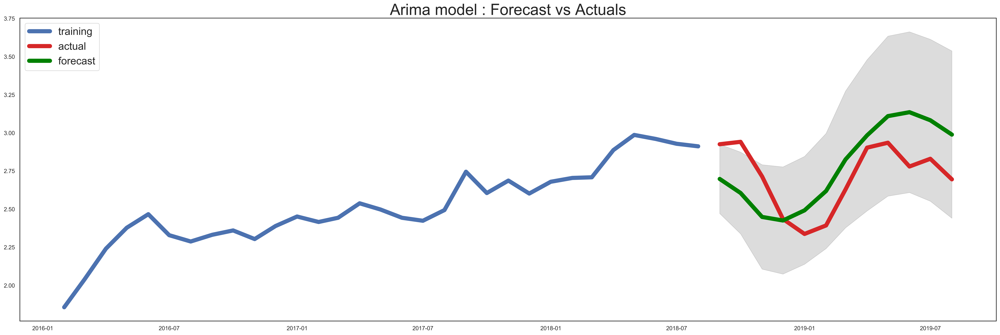

In [192]:
# Build Model 
model = ARIMA(train_p, order=(7, 1, 3))  
fitted = model.fit(disp=-2)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(12, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(30,10), dpi=200)
plt.plot(train_p[12:], label='training',linewidth=8)
plt.plot(test_p[:12], label='actual',linewidth=8,color='#D62728',)
plt.plot(fc_series, label='forecast',linewidth=8,color='green')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Arima model : Forecast vs Actuals',fontsize=30)
plt.legend(loc='upper left', fontsize=20)
plt.show()

In [184]:
# define exogenous variables 
exog1 = df.drop(columns=['Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)'])

In [185]:
exog1=exog1[exog1.index > '2015-01-01']
exog1.head()

,Weekly U.S. Ending Stocks of Finished Motor Gasoline (Thousand Barrels),U.S. Gasoline Demand (Thousand Barrels per Day),Weekly U.S. Imports of Finished Motor Gasoline (Thousand Barrels per Day),Weekly U.S. Product Supplied of Finished Motor Gasoline (Thousand Barrels per Day),Weekly U.S. Refiner and Blender Net Production of Finished Motor Gasoline (Thousand Barrels per Day),Weekly U.S. Exports of Finished Motor Gasoline (Thousand Barrels per Day),Motor Gasoline Consumed by the Transportation Sector(T/ B per Day),Motor Gasoline Consumed by the Commercial Sector(T/ B per Day),Motor Gasoline Consumed by the Industrial Sector(T/ B per Day)
Date,,,,,,,,,
2015-02-01,29658,8659,24,8659.000000,9435,588,8498.257,195.922,134.381
2015-03-01,29155,8957,14,8957.250000,9576,612,8717.704,200.981,137.851
2015-04-01,26561,9006,60,9006.333333,9835,546,8845.658,203.931,139.874
2015-05-01,25476,9191,48,9191.800000,9800,498,8915.920,205.551,140.985
2015-06-01,25969,9540,25,9540.500000,9842,396,9064.745,208.982,143.339


In [186]:
# split train and test for exogenous variables
exog_to_train1 = exog1.iloc[:-12]
exog_to_test1 = exog1.iloc[len(exog)-12:]

                                                               ARMA Model Results                                                               
Dep. Variable:     Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)   No. Observations:                   43
Model:                                                                                       ARMA(7, 8)   Log Likelihood                  29.835
Method:                                                                                         css-mle   S.D. of innovations              0.110
Date:                                                                                  Tue, 17 Dec 2019   AIC                             -7.669
Time:                                                                                          17:09:41   BIC                             38.122
Sample:                                                                                      02-01-2015   HQIC                    

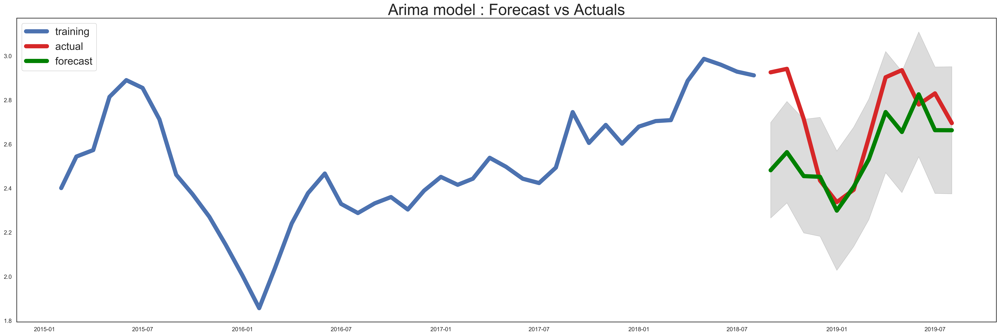

In [194]:
# Build Model 
model = ARIMA(train_p, order=(7, 0, 8),exog=exog_to_train1)  
fitted = model.fit(disp=-2)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(12, alpha=0.05 ,exog=exog_to_test1)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(30,10), dpi=200)
plt.plot(train_p, label='training',linewidth=8)
plt.plot(test_p, label='actual',linewidth=8,color='#D62728',)
plt.plot(fc_series, label='forecast',linewidth=8,color='green')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Arima model : Forecast vs Actuals',fontsize=30)
plt.legend(loc='upper left', fontsize=20)
plt.show()

In [92]:
# make for loop to present  the best pdq..
for param in pdq:
    try:
        mod_arima = ARIMA(train_p,order=param,exog=exog_to_train1)
        mod_arima_fit = mod_arima.fit()
        print(param,mod_arima_fit.aic)
    except:
        continue

(0, 0, 0) -13.05298228392202
(0, 0, 1) -19.674266273719255
(0, 0, 2) -27.225068217628248
(0, 0, 3) -22.632346239585488
(0, 0, 4) -20.09096715413652
(0, 0, 5) -16.2717201228251
(0, 0, 6) -17.96113207254588
(0, 0, 7) -16.150296909604563
(0, 0, 8) -15.673134357647697
(0, 1, 0) -53.42898777188755
(0, 1, 1) -53.50447871818449
(0, 1, 2) -51.40329897089518
(0, 1, 3) -49.42566412527151
(0, 1, 4) -49.058963090128714
(0, 1, 5) -47.19836562067701
(0, 1, 6) -49.350607877527324
(0, 1, 7) -47.338991263227854
(0, 2, 0) -28.54599063964001
(0, 2, 1) -34.271042048872275
(0, 2, 2) -37.101756341971125
(1, 0, 0) -34.98288860945492
(1, 0, 1) -33.74273733579419
(1, 0, 2) -34.110844915258824
(1, 0, 3) -27.013385833764218
(1, 1, 0) -53.73652559802653
(1, 1, 1) -51.59729884291073
(1, 2, 0) -31.952001253820995
(1, 2, 1) -35.368063744808566
(2, 0, 0) -34.231274383590474
(2, 0, 1) -31.04621429598855
(2, 0, 2) -30.03804458044955
(2, 1, 0) -51.720235416564634
(2, 1, 1) -49.57975191855459
(2, 1, 2) -46.88335410233671

In [106]:
#p,d,q  p = periods taken for autoregressive model
#d -> Integrated order, difference
# q periods in moving average model-----(7,0, 8)
mod_arima = ARIMA(train_p,order=(7, 0, 8),exog=exog_to_train1)
mod_arima_fit = mod_arima.fit()
print(mod_arima_fit.summary())
print(mod_arima_fit.aic)

                                                               ARMA Model Results                                                               
Dep. Variable:     Weekly U.S. All Grades All Formulations Retail Gasoline Prices  (Dollars per Gallon)   No. Observations:                   43
Model:                                                                                       ARMA(7, 8)   Log Likelihood                  29.835
Method:                                                                                         css-mle   S.D. of innovations              0.110
Date:                                                                                  Sun, 15 Dec 2019   AIC                             -7.669
Time:                                                                                          23:48:47   BIC                             38.122
Sample:                                                                                      02-01-2015   HQIC                    

In [107]:
# make prediction .
prediction= mod_arima_fit.forecast(steps=12,exog=exog_to_test1)[0]
prediction

array([2.48193272, 2.56388683, 2.45538699, 2.45224993, 2.2989121 ,
       2.40645346, 2.53155014, 2.74561726, 2.65533434, 2.82600827,
       2.66350369, 2.6631872 ])

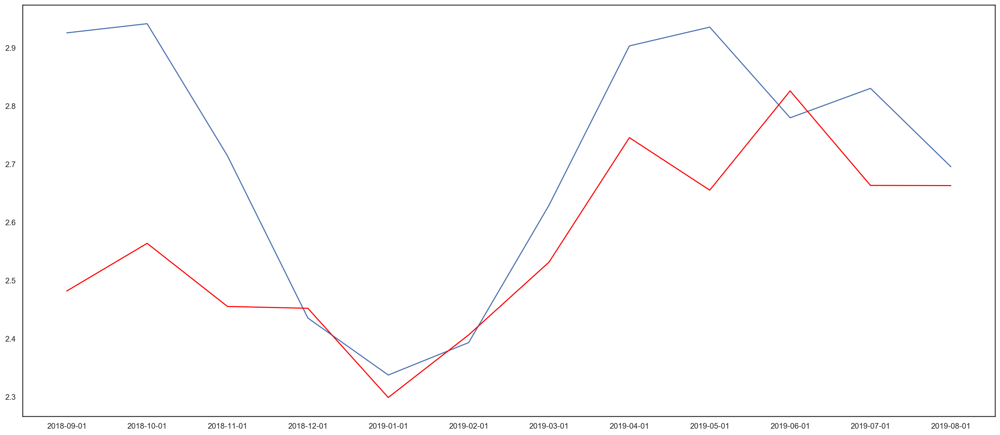

In [108]:
# plot the test vs predictions
sns.set(style="white")
plt.figure(figsize=(22, 10))
plt.plot(test_p)
plt.plot(prediction,color='red')

In [109]:
# check the r2_score
r2_score(test_p,prediction)

-0.04466216645068455